In [5]:
import torch 
import torchvision
from typing import List, Tuple
from torch import Tensor
from torch.utils.data import Dataset, DataLoader, SequentialSampler

import clip

import numpy as np 
import cv2 
from PIL import Image, ImageDraw 

import json 
from tqdm import tqdm 
from spacy.en import English
nlp = English()

ModuleNotFoundError: No module named 'spacy'

In [4]:
class paths:
    panorama = '/data1/saaket/jpegs_manhattan_touchdown_2021/'
    pano_slice = '/data1/saaket/lsd_data/data/processed/pano_slices/'
    touchdown= '/data1/saaket/touchdown/data/'
    train = touchdown + 'train.json'
    dev = touchdown + 'dev.json'
    test = touchdown + 'test.json'
    device = 'cuda:7' if torch.cuda.is_available() else 'cpu'

In [ ]:
class ImageList:
    """
    Structure that holds a list of images (of possibly
    varying sizes) as a single tensor.
    This works by padding the images to the same size,
    and storing in a field the original sizes of each image
    Args:
        tensors (tensor): Tensor containing images.
        image_sizes (list[tuple[int, int]]): List of Tuples each containing size of images.
    """

    def __init__(self, tensors: Tensor, image_sizes: List[Tuple[int, int]]) -> None:
        self.tensors = tensors
        self.image_sizes = image_sizes

    def to(self, device: torch.device) -> "ImageList":
        cast_tensor = self.tensors.to(device)
        return ImageList(cast_tensor, self.image_sizes)

class RPNDataset(Dataset):
    def __init__(self, image_list, transforms):
        self.image_list = image_list 
        self.transforms = transforms 
    
    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        image_path = paths.pano_slice + f"{self.image_list[idx][:-2]}/{self.image_list[idx]}.jpg"
        pano = Image.open(image_path)

        return self.transforms(pano)

class AnchorImageDataset(Dataset):
    def __init__(self, image, coords, transforms):
        self.image = image.copy()
        self.coords = coords
        self.transforms = transforms

    def __len__(self):
        return len(self.coords)

    def __getitem__(self, idx):
        coord = self.coords[idx]
        return self.transforms(self.image.crop(coord))

In [7]:
def get_unique_panos(data_path):
    '''Compute unique panoramasa from data file. These panos are unique to a particular train/dev/test file'''
    panoids = []
    with open(data_path) as f:
        for idx, line in enumerate(f):
            obj = json.loads(line)
            panoids.append(obj['main_pano'])
    return np.unique(panoids)

def get_pano2id(unique_panos):
    pano2id = {}
    id2pano = {}
    for i, pano in enumerate(unique_panos):
        pano2id[pano] = i 
        id2pano[i] = pano
    return pano2id, id2pano 

def touchdown_loader(data_path):
    texts, panoids = [], []
    with open(data_path) as f:
        for idx, line in enumerate(f):
            obj = json.loads(line)
            panoids.append(obj['main_pano'])
            texts.append(obj['td_location_text'])
    return texts, panoids 

mode = 'train'
unique_panos = get_unique_panos(paths.train)
text, panoids = touchdown_loader(paths.train)
pano2id, id2pano = get_pano2id(unique_panos)
device = paths.device 

In [8]:
text[0]

"There's a black hydrant with a silver cap between two silver bollards on the sidewalk. Touchdown is on the cap of the hydrant."

In [112]:
unique_pano_slices = []
for pano in unique_panos:
    for i in range(8):
        unique_pano_slices.append(f'{pano}_{i}')

In [113]:
slice2id, id2slice = get_pano2id(unique_pano_slices)

In [90]:
def generate_bounding_boxes(unique_panos, device):
    fasterRCNN = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)
    fasterRCNN.eval() 
    fasterRCNN.to(device)


    tfms = torchvision.transforms.Compose([
        torchvision.transforms.PILToTensor(),
        torchvision.transforms.ConvertImageDtype(torch.float)
    ])
    
    # model, transform = clip.load('RN50', device=device)
    
    rpn_dataset = RPNDataset(unique_panos, tfms)
    
    rpn_loader = DataLoader(rpn_dataset, batch_size=8, num_workers=8)
    bboxes = []
    for enum, imgData in enumerate(tqdm(rpn_loader)):
        imlist = ImageList(imgData, [tuple(i.size()[1:]) for i in imgData])
        imlist = imlist.to(device)
        features = fasterRCNN.backbone(imlist.tensors)
        with torch.no_grad():
            proposals, proposal_losses = fasterRCNN.rpn(imlist, features, )
        # props = proposals.detach().to('cpu').int()#.numpy().tolist()
        props = [p.detach().to('cpu').int().numpy().tolist() for p in proposals]
        del imlist 
        bboxes.extend(props)
    return bboxes 

In [13]:
bboxes = generate_bounding_boxes(unique_pano_slices, paths.device)

100%|██████████| 1342/1342 [02:09<00:00, 10.37it/s]


In [19]:
np.save('/data2/saaket/best_dev_boxes_perspective.npy', bboxes)

In [114]:
bboxes = np.load('/data2/saaket/bounding_boxes/best_train_boxes_perspective.npy')

In [30]:
def compute_area(box):
    x1, y1, x2, y2 = box 
    return (y2-y1)*(x2-x1)

In [8]:
def visualize_bounding_boxes(perspective_id, bboxes, n_boxes):
    image_path = paths.pano_slice + f"{perspective_id[:-2]}/{perspective_id}.jpg"
    image = Image.open(image_path)
    for box in bboxes[:n_boxes]:
        x1, y1, x2, y2 = box 
        draw = ImageDraw.Draw(image)
        draw.rectangle((x1, y1, x2, y2), outline=(255, 0, 0), width=1)
    return image 

In [9]:
assert len(unique_pano_slices) == len(bboxes)

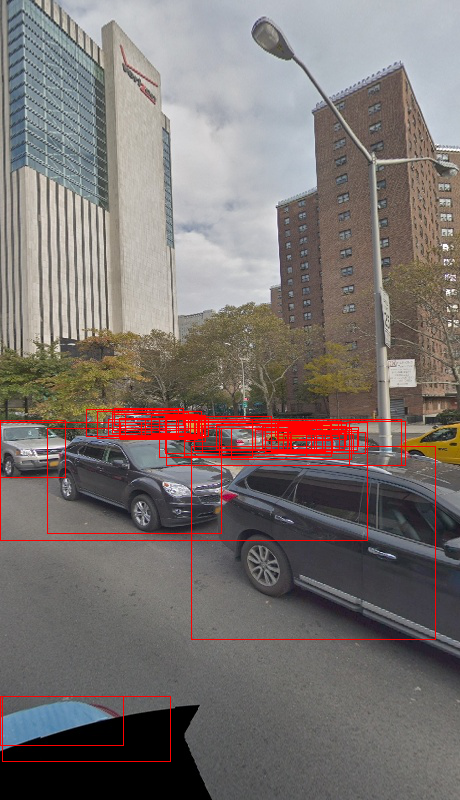

In [10]:
visualize_bounding_boxes(unique_pano_slices[9], bboxes[9], 50)

In [12]:
def compute_image_features_and_detect_region(perspective_ids, bboxes, td_text, transform, detector, device):
    
    def compute_anchor_features(model, device, anchor_loader):
        anchor_features = []
        for anchor_batch in anchor_loader:
            with torch.no_grad():
                anchor_features_ = model.encode_image(anchor_batch.to(device))
            anchor_features.append(anchor_features_)
        
        anchor_features = torch.vstack(anchor_features)
        anchor_features /= anchor_features.norm(dim=-1, keepdim=True)
        return anchor_features
    
    pano_features = []
    for idx, pid in enumerate(perspective_ids):
        
        image_path = paths.pano_slice + f"{pid[:-2]}/{pid}.jpg"
        perspective_image = Image.open(image_path)
        
        anchor_dataset = AnchorImageDataset(perspective_image, bboxes[idx], transform)
        anchor_loader = DataLoader(anchor_dataset, 
                    batch_size=1000, 
                    sampler=SequentialSampler(anchor_dataset),
                    pin_memory=False,
                    drop_last=False,
                    num_workers=8,)
        image_features = compute_anchor_features(detector, device, anchor_loader)
        pano_features.append(image_features)
    pano_features = torch.vstack(pano_features)
    text_arr = td_text.split('.')
    text_arr.remove('')

    tokens = clip.tokenize(text_arr).to(device)
    with torch.no_grad():
        text_features = detector.encode_text(tokens)
        text_features /= text_features.norm(dim=-1, keepdim=True)

    print(pano_features.size(), text_features.size()) 
    similarity_scores = pano_features @ text_features.T 
    
    return similarity_scores

In [115]:
def detect_regions(image_features, td_text, text_encoder, device):

    image_features = image_features.to(device)
    text_arr = td_text.split('.')
    if '' in text_arr:
        text_arr.remove('')

    tokens = clip.tokenize(text_arr).to(device)
    with torch.no_grad():
        text_features = text_encoder.encode_text(tokens)
        text_features /= text_features.norm(dim=-1, keepdim=True)

    similarity_scores = image_features @ text_features.T 

    return similarity_scores 
    

In [12]:
model, transform = clip.load('ViT-B/32', device=paths.device)

In [116]:
def get_pano_slice_names(panoid):
    return [f"{panoid}_{i}" for i in range(8)]

In [121]:
pano_slice_names = get_pano_slice_names(panoids[3813])
pano_slice_ids = [slice2id[j] for j in pano_slice_names]
td_text = text[3813]

In [118]:
for enum, panoid in enumerate(panoids):
    if panoid == unique_panos[4]:
        print(enum, panoid)

3813 --uzEUUSL39SncbSBviBVw


In [122]:
pano_slice_ids

[32, 33, 34, 35, 36, 37, 38, 39]

In [31]:
# counter = 0
# for boxes_in_image in bboxes:
#     for box in boxes_in_image:
#         if box[1] == box[3]:
#             counter += 1
#             # box[2] = box[0] + 1
# print(counter)

0


In [30]:
len(unique_pano_slices)

10736

In [18]:
scores = compute_image_features_and_detect_region(
    perspective_ids = pano_slice_names, 
    bboxes = bboxes[pano_slice_ids],
    td_text = td_text,
    transform=transform, 
    detector=model,
    device=paths.device
    )

torch.Size([8000, 512]) torch.Size([2, 512])


In [142]:
image_feature_paths = [
    '/data2/saaket/image_features_sdr_perspective_train0_10.pth',
    '/data2/saaket/image_features_sdr_perspective_train10_20.pth',
    '/data2/saaket/image_features_sdr_perspective_train20_30.pth',
    '/data2/saaket/image_features_sdr_perspective_train30_40.pth',
]
# image_feature_paths = [
#     '/data2/saaket/features_image/image_features_sdr_perspective_dev_5000.pth',
#     '/data2/saaket/features_image/image_features_sdr_perspective_dev_end.pth',
# ]

image_features = torch.vstack([torch.load(ifeat).cpu()for ifeat in image_feature_paths])

In [143]:
image_features.size()

torch.Size([40000, 512])

In [144]:
scores = detect_regions(image_features[1000*pano_slice_ids[0]:1000*(pano_slice_ids[-1] + 1)], td_text, model, paths.device)

In [145]:
scores.argmax(dim=0).cpu().tolist()

[7509, 3932]

In [26]:
bboxes.shape

(44456, 1000, 4)

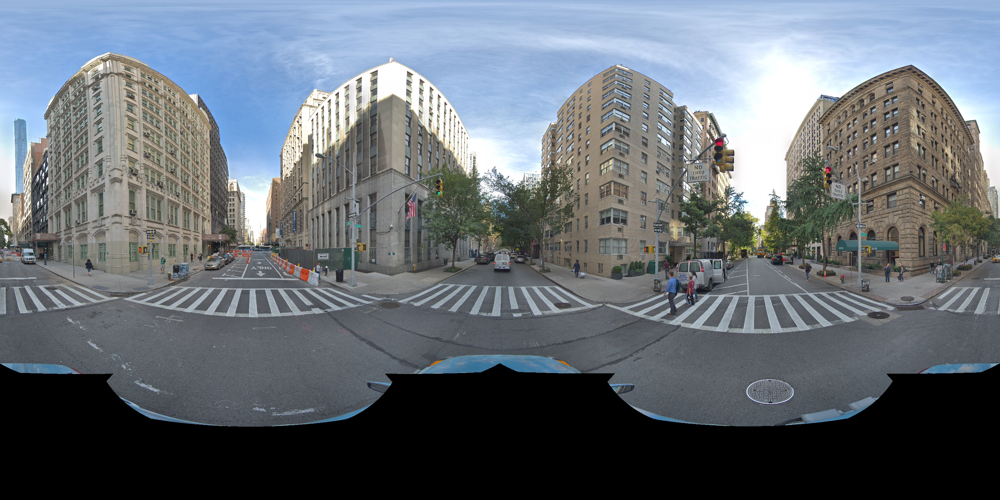

In [119]:
Image.open('/data1/saaket/jpegs_manhattan_touchdown_2021/--uzEUUSL39SncbSBviBVw.jpg')

In [146]:
def visualize_regions(scores, perspective_ids, bboxes):
    best_box_indices = scores.argmax(dim=0).cpu().tolist()
    slice_indices = [i // 1000 for i in best_box_indices]
    offsets = [i % 1000 for i in best_box_indices]
    colors = ['red', 'blue', 'green']
    images = []
    for id in range(len(best_box_indices)):
        slice_index, offset = slice_indices[id], offsets[id]
        best_bbox = bboxes[slice_index][offset]
        pid = perspective_ids[slice_index]
        image_path = paths.pano_slice + f"{pid[:-2]}/{pid}.jpg"
        image = Image.open(image_path)
        x1, y1, x2, y2 = best_bbox 
        draw = ImageDraw.Draw(image)
        draw.rectangle((x1, y1, x2, y2), outline=colors[id])
        images.append(image)
    return images 

In [147]:
ims = visualize_regions(scores, pano_slice_names, bboxes[pano_slice_ids])

In [148]:
td_text

'Look to the right for a green and red fire hydrant. Touchdown is sitting on top of the fire hydrant.'

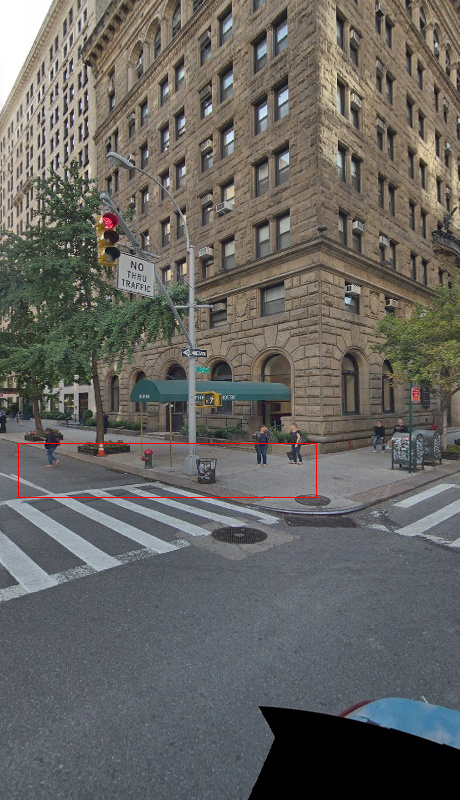

In [151]:
ims[0]

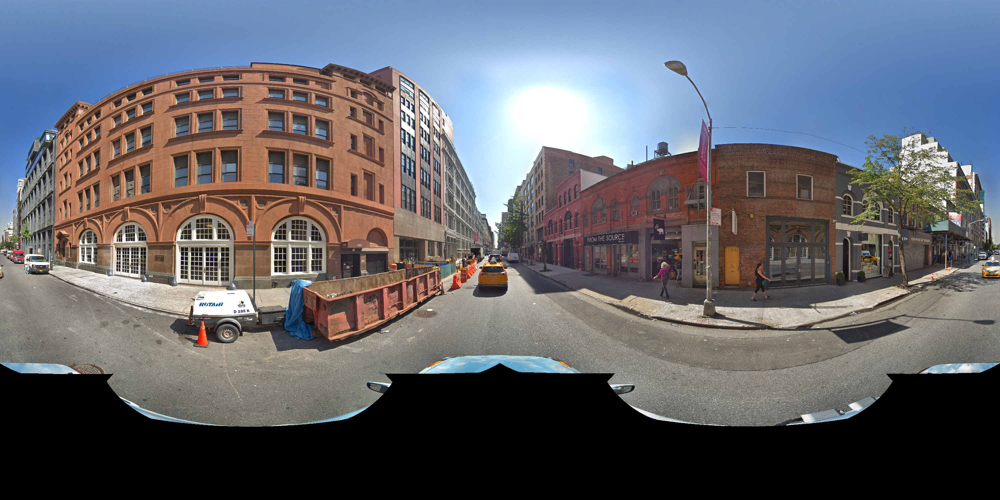

In [62]:
Image.open(f"/data1/saaket/jpegs_manhattan_touchdown_2021/{panoids[1]}.jpg")